# View and process the results of a geoclaw run

In [1]:
#set up environment and imported modules

import os
os.environ['CLAW'] = 'Users/anitamiddleton/Documents/python/clawpack'
os.environ['FC'] = 'gfortran'
dir = 'Users/anitamiddleton/Documents/python/tsunami_proj/tokachi2003'
%pylab inline

from clawpack.clawutil import nbtools
from clawpack.visclaw import animation_tools
from IPython.display import HTML, Image
from clawpack.geoclaw import dtopotools
import matplotlib.pyplot as plt
import numpy as np


%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [55]:
def show_anim(anim):
    html_version = HTML(anim.to_jshtml())
    # html_version = HTML(anim.to_html5_video())
    return html_version

In [88]:
# read in results
plotdir = '/Users/anitamiddleton/Documents/python/tsunami_proj/outputs/tokachi2003/_plots'
anim = animation_tools.animate_from_plotdir(plotdir, figno=0)
show_anim(anim)

2025-07-18 14:44:51,984 INFO CLAW: Animation.save using <class 'matplotlib.animation.HTMLWriter'>
2025-07-18 14:44:51,985 INFO CLAW: figure size in inches has been adjusted from 6.0 x 4.7362428842504745 to 6.0 x 4.72


## Output Gauge Results

In [2]:
# Process observation data
import os 
import numpy as np

# Read in observations for Urakawa
scratch_dir = '/Users/anitamiddleton/Documents/python/tsunami_proj/scratch/tokachi2003'
gauge_path = os.path.join(scratch_dir, 'tide_gauge_observations/urakawa.csv') # observed tide gauge data

# skiprows=4 because the file for urakawa begins at 4:00 JST and the earthquake is at 4:50 JST
observed_urakawa = np.loadtxt(gauge_path, delimiter=',', skiprows=4) # x,y time,height
observed_urakawa[:,0] = (observed_urakawa[:,0]- 0.5)*60

# observations for Kushiro
gauge_path = os.path.join(scratch_dir, 'tide_gauge_observations/kushiro.csv') # observed tide gauge data
observed_kushiro = np.loadtxt(gauge_path, delimiter=',', skiprows=4) # x,y time,height
observed_kushiro[:,0] = (observed_kushiro[:,0]- 0.5)*60

# observations for Tokachikou
# observations are in minutes and begin at the time of the earthquake?
gauge_path = os.path.join(scratch_dir, 'tide_gauge_observations/tokachi.csv') # observed tide gauge data
observed_tokachi = np.loadtxt(gauge_path, delimiter=',', skiprows=1) # x,y time,height


Read in gauge 129.
Read in gauge 111.
Read in gauge 112.


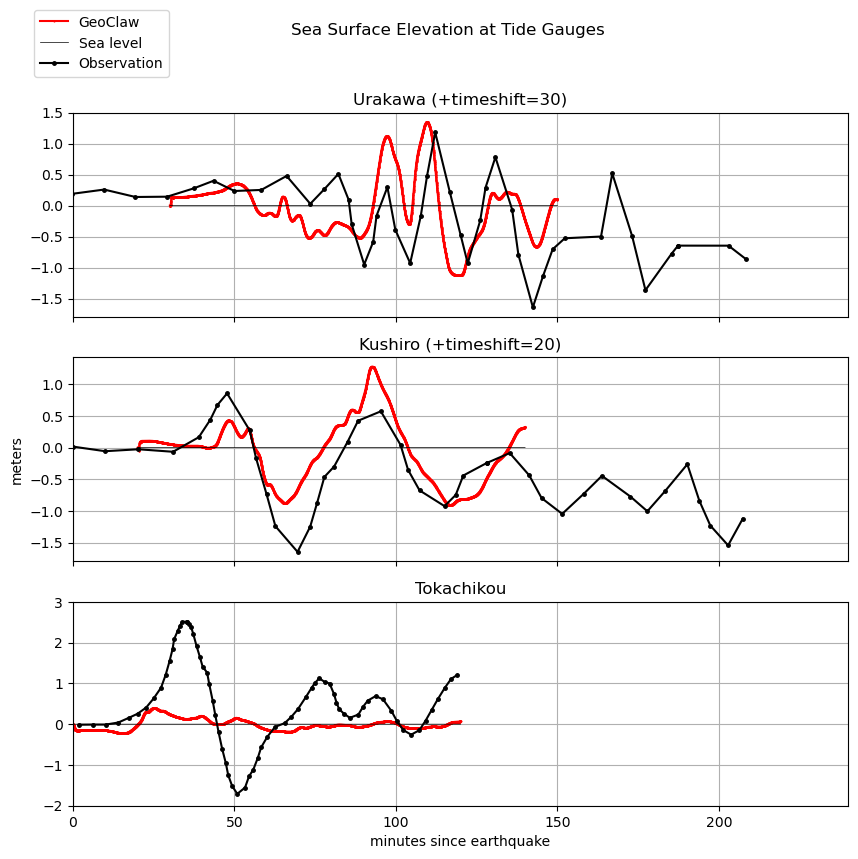

In [ ]:
# plot combined gauge results from all gauges and their observations to compare
import matplotlib.pyplot as plt

from setplot import setplot
plotdata = setplot()

outdir = '/Users/anitamiddleton/Documents/python/tsunami_proj/outputs/tokachi2003/_output'

plotdata.outdir = outdir 
g129 = plotdata.getgauge(129)
t = (g129.t / 60.) + 30 # convert to minutes 
eta = g129.q[3,:]   # eta = h + B (depth plus bathymetry)

g111 = plotdata.getgauge(111)
t2 = (g111.t / 60.) + 20 # convert to minutes 
eta2 = g111.q[3,:]   # eta = h + B (depth plus bathymetry)

g112 = plotdata.getgauge(112)
t3 = (g112.t / 60.)  # convert to minutes 
eta3 = g112.q[3,:]   # eta = h + B (depth plus bathymetry)

# plot the comparison

plt.close('all')
fig, (ax1, ax2, ax3) = plt.subplots(3, sharex=True)
fig.suptitle('Sea Surface Elevation at Tide Gauges')
ax1.set_title("Urakawa (+timeshift=30)")
ax1.plot(t,eta, 'r.-', markersize=1, label='GeoClaw')
ax1.plot(observed_urakawa[:,0], observed_urakawa[:,1], 'k.-', markersize=5, label='Observation') 
ax1.plot(t,0*t, 'k-', label='Sea level', linewidth=0.5)
ax1.grid(True)
#ax1.set_ylabel("meters")

ax2.set_title("Kushiro (+timeshift=20)")
ax2.plot(t2,eta2, 'r.-', markersize=1, label='GeoClaw')
ax2.plot(observed_kushiro[:,0], observed_kushiro[:,1], 'k.-', markersize=5, label='Observation') # cm to m in erimo observations
ax2.plot(t2,0*t2, 'k-', label='Sea level', linewidth=0.5)
ax2.grid(True)
ax2.set_ylabel("meters")

ax3.set_title("Tokachikou")
ax3.plot(t3,eta3, 'r.-', markersize=1, label='GeoClaw')
ax3.plot(t3,0*t3, 'k-', label='Sea level', linewidth=0.5)
ax3.plot(observed_tokachi[:,0], observed_tokachi[:,1], 'k.-', markersize=5, label='Observation') 
ax3.grid(True)
ax3.set_ylim(-2, 3)
plt.xlim(0,240)
plt.xlabel('minutes since earthquake')
#plt.ylabel('meters')
fig.set_size_inches(10, 9)
plt.legend(bbox_to_anchor=(-0.05, 3.905), loc='upper left', borderaxespad=0.)

if 0:
    image_dir = '/Users/anitamiddleton/Documents/python/tsunami_proj/outputs/tokachi2003/images'
    image_fname = os.path.join(image_dir, 'tideGaugesTest3.png')
    plt.savefig(image_fname, bbox_inches='tight')


plt.show()



## Process Fgmax data

In [5]:
# read in fgmax data

# for rundata.fgmax_data.num_fgmax_val = 1 : 
# columns in file: lon, lat, amr_level, topo value B, maximum depth h, time of max h, arrival time 

from clawpack.visclaw import colormaps
from clawpack.visclaw import plottools
from clawpack.visclaw.plottools import pcolorcells
from clawpack.geoclaw import fgmax_tools
from matplotlib import colors 
import glob

fg = fgmax_tools.FGmaxGrid()
fg.outdir = outdir
data_file = 'fgmax_grids.data'
fg.read_fgmax_grids_data(fgno=1, data_file=data_file) # currently only one fgmax grid used
fg.read_output()

t_files = glob.glob(outdir + '/fort.t0*') # grabs all the timing files 
times = []
for f in t_files:
    lines = open(f,'r').readlines()
    for line in lines:
        if 'time' in line: 
            t = float(line.split()[0])
    times.append(t)
times.sort()
print('Output times found: ',times)
if len(times) > 0:
    t_hours = times[-1] / 3600.
    print('\nfgmax results are presumably from final time: %.1f seconds = %.2f hours'\
          % (times[-1], t_hours))
else:
    t_hours = np.Nan


# read in initial topography/bathymetry values for fgmax grid before dtopo event
fname = '/Users/anitamiddleton/Documents/python/tsunami_proj/scratch/tokachi2003/tokachi2003_B0.txt'
print('Loading B0 from %s' % fname)
B0 = np.loadtxt(fname)
B0_masked = np.ma.masked_array(B0, fg.B.mask)
fg.dz = fg.B - B0_masked
fg.B0 = B0_masked

print('Maximum dz between fg.B and new fg.B0 = %.3f'  % abs(fg.B0 - fg.B).max())

Reading input for fgno=1, point_style = 4 
Reading /Users/anitamiddleton/Documents/python/tsunami_proj/outputs/tokachi2003/_output/fgmax0001.txt ...
point_style == 4, found 391680 points 
Will map fgmax points onto masked arrays defined by file:
     /Users/anitamiddleton/Documents/python/tsunami_proj/scratch/tokachi2003/fgmax_pts_topostyle.txt
Deduced dx = 0.00416667, dy = 0.00416667
converted level to 2d array
converted B to 2d array
converted h to 2d array
converted h_time to 2d array
not converting attribute s == None
not converting attribute s_time == None
not converting attribute hs == None
not converting attribute hs_time == None
not converting attribute hss == None
not converting attribute hss_time == None
not converting attribute hmin == None
not converting attribute hmin_time == None
converted arrival_time to 2d array
Output times found:  [0.0, 150.0, 300.0, 450.0, 600.0, 750.0, 900.0, 1050.0, 1200.0, 1350.0, 1500.0, 1650.0, 1800.0, 1950.0, 2100.0, 2250.0, 2400.0, 2550.0, 270

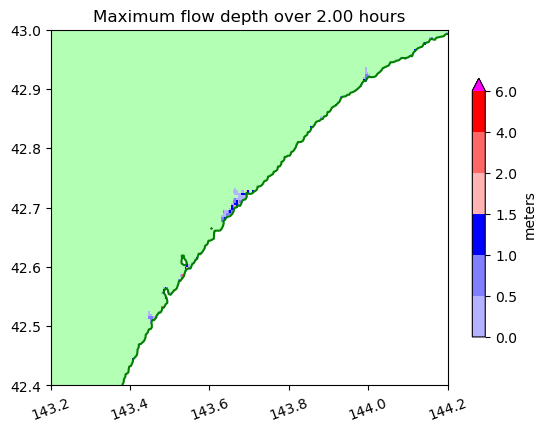

2.8503127
(array([149]), array([345]))
[142.93958333] [42.12291667]
[2.8503127]


In [ ]:
# plot onshore inundation
# code taken from https://depts.washington.edu/ptha/WA_EMD_2021/ process_fgmax.py
# For plotting the inundation depth on shore without showing offshore depths, and for plotting `eta = B + h` only offshore.

# find onshore and offshore points of the grid
onshore = fg.B0 > 0.0
if fg.force_dry_init is not None:
    onshore = np.logical_or(onshore, fg.force_dry_init)
offshore = np.logical_not(onshore)

fg.h_onshore = np.ma.masked_where(offshore, fg.h)
fg.eta_offshore = np.ma.masked_where(onshore, fg.B0 + fg.h)  # use B0 for continuity at shore


# ## Plot maximum flow depth
bounds_depth = np.array([1e-6,0.5,1.0,1.5,2,4.0,6.0]) 
cmap_depth = colors.ListedColormap([[.7,.7,1],[.5,.5,1],[0,0,1], [1,.7,.7], [1,.4,.4], [1,0,0]])

# Set color for value exceeding top of range to purple:
cmap_depth.set_over(color=[1,0,1])

# Set color for land points without inundation to light green:
cmap_depth.set_under(color=[.7,1,.7])
norm_depth = colors.BoundaryNorm(bounds_depth, cmap_depth.N)
    
plt.close('all')
fig, ax = plt.subplots()
figsize=(8,10)
pc = plottools.pcolorcells(fg.X, fg.Y, fg.h_onshore, cmap=cmap_depth, norm=norm_depth)
cb = plt.colorbar(pc, extend='max', shrink=0.7)
cb.set_label('meters')
plt.contour(fg.X, fg.Y, fg.B0, [0], colors='g')

ax.set_aspect(1./np.cos(48*np.pi/180.))
plt.ticklabel_format(useOffset=False)
plt.xticks(rotation=20)
plt.title('Maximum flow depth over %.2f hours' % t_hours)

plt.xlim([143.2, 144.2])
plt.ylim([42.4, 43])

# plt.xlim([144.95, 145.4])
# plt.ylim([42.9, 43.2])
if 0:
    image_dir = '/Users/anitamiddleton/Documents/python/tsunami_proj/outputs/tokachi2003/images'
    image_fname = os.path.join(image_dir, 'flowDepthUrahoro_Test3.png')
    plt.savefig(image_fname, bbox_inches='tight')

plt.show()

print(np.max(fg.h_onshore))
thing = np.nonzero(fg.h == np.max(fg.h_onshore))
print(thing)
print(fg.X[thing[0], thing[1]], fg.Y[thing[0], thing[1]])

#X[i,j],Y[i,j] corresponds to point x[i],y[j]
print(fg.h[thing[0], thing[1]])

# In the plot above, green shows fgmax points that never got wet.  
# The green contour shows `B0 = 0`, and note that some of the initially dry region below MHW never got wet 
# (over the limited duration of this simulation).
# 
# White areas are masked out either because they were not fgmax points or because they were initially wet. 
# 
# Regions colored blue or red are initially dry fgmax points that did get wet during the tsunami, 
# with color showing the maximum depth of water recorded.

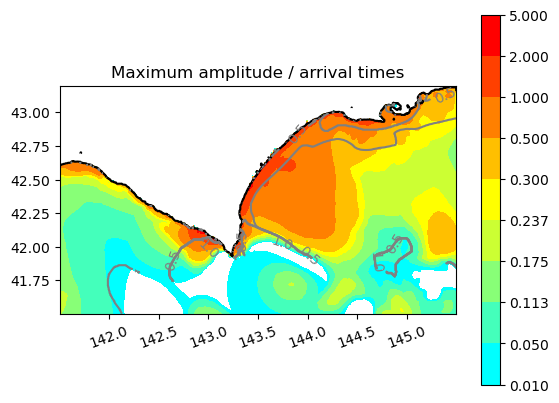

In [ ]:
# maximum amplitude and timing plots (I have no idea where this is from?)
from clawpack.visclaw import geoplot

# color bar lines
clines_zeta = [0.01] + list(np.linspace(0.05,0.3,5)) + [0.5, 1.0, 2.0, 5.0]
colors = geoplot.discrete_cmap_1(clines_zeta)
plt.figure(1)
plt.clf()

zeta = np.where(fg.B>0, fg.h, fg.h+fg.B)   # surface elevation onshore? in ocean?
plt.contourf(fg.X,fg.Y,zeta,clines_zeta,colors=colors)
plt.colorbar()
plt.contour(fg.X,fg.Y,fg.B0,[0.],colors='k')  # coastline (where height is zero?)

# plot arrival time contours and label:
arrival_t = fg.arrival_time/3600.  # arrival time in hours
clines_t = np.linspace(0,1,5)  # hours
clines_t_label = clines_t[2::2]  # which ones to label 
clines_t_colors = ([.5,.5,.5],)
con_t = plt.contour(fg.X,fg.Y,arrival_t, clines_t,colors=clines_t_colors) 
plt.clabel(con_t, clines_t_label)

# fix axes:
plt.ticklabel_format(style='plain',useOffset=False)
plt.xticks(rotation=20)
plt.gca().set_aspect(1./np.cos(fg.Y.mean()*np.pi/180.))
plt.title("Maximum amplitude / arrival times")
if 0:
    image_dir = '/Users/anitamiddleton/Documents/python/tsunami_proj/outputs/tokachi2003/images'
    image_fname = os.path.join(image_dir, 'waveAmpTest3.png')
    plt.savefig(image_fname, bbox_inches='tight')
plt.show()